In [ ]:
# Importing required library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In this part I will be using pandas dataframe to read the mega merged csv file, which is the file that came from, Carbon Disclosure Project (CDP) and Financial Modeling Prep (FMP) APIs

In [ ]:
df = pd.read_csv('Mega_merged_all_real_values.csv')
df

<ipython-input-23-e93d87d57460>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Mega_merged_all_real_values.csv')


,account_id,account_name,incorporated_country,ticker,Evaluation_status,Scope_3_emissions_type,Scope_3_emissions_amount,Symbol_1,Year,Market_Cap,...,grossProfit_USD,netIncome_USD,cashAndCashEquivalents_USD,shortTermInvestments_USD,longTermInvestments_USD,totalAssets_USD,totalLiabilities_USD,totalInvestments_USD,totalDebt_USD,totalEquity_USD
0,44,3i Group,United Kingdom,III LN,"Relevant, calculated",Waste generated in operations,12.340,III.L,2013,3.654278e+09,...,938530000.0,656590000.0,816610000.0,0.0,4.460240e+09,5.572760e+09,1.371600e+09,4.460240e+09,1.078230e+09,4.201160e+09
1,44,3i Group,United Kingdom,III LN,"Relevant, calculated",Business travel,56.780,III.L,2013,3.654278e+09,...,938530000.0,656590000.0,816610000.0,0.0,4.460240e+09,5.572760e+09,1.371600e+09,4.460240e+09,1.078230e+09,4.201160e+09
2,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Purchased goods and services,53635.120,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Waste generated in operations,2518.180,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53,Abertis Infraestructuras,Spain,ABE SM,"Relevant, calculated",Business travel,913.420,ABE.MC,2013,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181151,1003410,Telenco Networks,France,NaN,"Relevant, calculated",Business travel,60.310,Not found,2023,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181152,1003410,Telenco Networks,France,NaN,"Relevant, calculated",Employee commuting,170.680,Not found,2023,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181153,1003410,Telenco Networks,France,NaN,"Relevant, calculated",Downstream transportation and distribution,699.520,Not found,2023,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
181154,1003410,Telenco Networks,France,NaN,"Relevant, calculated",End of life treatment of sold products,7477.550,Not found,2023,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We here have a file outliers.csv which are the outliers calculated from Z-score where outliers were addressed by calculating standard deviation of a companys emissions in each emission category over the years of their reporting.

As we already have outliers.csv created so will be removing those values from our Mega_merged_all_real_values.csv.

In [ ]:
df_outliers = pd.read_csv('outliers.csv')

# Removing data from original dataset if mattched value exists using account_name, emission type, year and emission amount.

df = df[
    ~(
        (df['account_name'].isin(df_outliers['account_name'])) &
        (df['Scope_3_emissions_type'].isin(df_outliers['Scope_3_emissions_type'])) &
        (df['Year'].isin(df_outliers['Year'])) &
        (df['Scope_3_emissions_amount'].isin(df_outliers['Scope_3_emissions_amount']))
    )
]

After data cleaning let's do further EDA steps on it.


Initially, lets see the unique values of emission type we have in our dataframe now.

In [ ]:
df['Scope_3_emissions_type'].unique()

array(['Waste generated in operations', 'Business travel',
       'Purchased goods and services', 'Employee commuting',
       'Capital goods', 'Upstream transportation and distribution',
       'Upstream leased assets', 'Investments',
       'Downstream transportation and distribution',
       'Processing of sold products', 'Use of sold products',
       'End of life treatment of sold products',
       'Downstream leased assets', 'Franchises', 'Other (upstream)',
       'Other (downstream)',
       'Fuel-and-energy-related activities (not included in Scope 1 or 2)'],
      dtype=object)

Let's get the concise summary of our updated dataset.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 179460 entries, 0 to 181155
Data columns (total 42 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   account_id                    179460 non-null  int64  
 1   account_name                  179460 non-null  object 
 2   incorporated_country          179460 non-null  object 
 3   ticker                        116650 non-null  object 
 4   Evaluation_status             178614 non-null  object 
 5   Scope_3_emissions_type        179460 non-null  object 
 6   Scope_3_emissions_amount      179460 non-null  float64
 7   Symbol_1                      179460 non-null  object 
 8   Year                          179460 non-null  int64  
 9   Market_Cap                    114461 non-null  float64
 10  Employee_Count                23073 non-null   float64
 11  ebitda                        116976 non-null  float64
 12  Revenue                       116976 non-null  fl

Checking if our dataset contains null values for our entire column and if exists summing them up to get the exact Column and Number of missing values on it.

In [ ]:
df.isnull().sum()

,0
account_id,0
account_name,0
incorporated_country,0
ticker,62810
Evaluation_status,846
Scope_3_emissions_type,0
Scope_3_emissions_amount,0
Symbol_1,0
Year,0
Market_Cap,64999


While observing the dataset I have found out that, some countries having similar names have different values in it for example, Czechia and Czech Republic are similar countries but we have it twice in dataset. So using replace function to replace those country names which are same but named differently.

In [ ]:
# Cleaning incorporating country columns
df['incorporated_country'] = df['incorporated_country'].replace('Ã…land Islands', 'Finland')
df['incorporated_country'] = df['incorporated_country'].replace('China, Hong Kong Special Administrative Region', 'China')
df['incorporated_country'] = df['incorporated_country'].replace('China, Macao Special Administrative Region', 'China')
df['incorporated_country'] = df['incorporated_country'].replace('Czechia', 'Czech Republic')
df['incorporated_country'] = df['incorporated_country'].replace('Faroe Islands', 'Denmark')
df['incorporated_country'] = df['incorporated_country'].replace('Guernsey', 'United Kingdom')
df['incorporated_country'] = df['incorporated_country'].replace('Hong Kong', 'China')
df['incorporated_country'] = df['incorporated_country'].replace('Isle of Man', 'United Kingdom')
df['incorporated_country'] = df['incorporated_country'].replace('Jersey', 'United Kingdom')
df['incorporated_country'] = df['incorporated_country'].replace('Norfolk Island', 'Australia')
df['incorporated_country'] = df['incorporated_country'].replace('Republic of Korea', 'South Korea')
df['incorporated_country'] = df['incorporated_country'].replace('Russian Federation', 'Russia')
df['incorporated_country'] = df['incorporated_country'].replace('United Kingdom of Great Britain and Northern Ireland', 'United Kingdom')
df['incorporated_country'] = df['incorporated_country'].replace('United States Minor Outlying Islands', 'USA')
df['incorporated_country'] = df['incorporated_country'].replace('Venezuela (Bolivarian Republic of)', 'Venezuela')
df['incorporated_country'] = df['incorporated_country'].replace('Viet Nam', 'Vietnam')

Also we can see Two Columns for each finiancial data, where in simple terms, we have Revenue and Revenue_USD where there are missing values on either of them, if Revenue has a value then Revenue_USD has a missing value, so for now I have thought to use on USD values, so I will be converting those Revenue Column value to Revenue_USD column as we will be taking only one currency so if we have missing values at USD column we fill it out thorugh, python library forex-python.

Ticker basically is used as short names for the company names for now we can use the actual company name for better understanding of the data.


# Country wise currency conversion to USD


I see reportedCurrency	has 26544 but incorporated countries has 0.

Now let us create a new dataset by taking reportedCurrency only as USD where remaining will be left and converted into USD according to their business location (country) using a python currency converter library then will be merged with the dataset and again let us calculate. isnull().sum().

### Step 1: Group by 'incorporated_country' and find the first non-empty 'reportedCurrency'


In [ ]:
country_currency_mapping = df.groupby('incorporated_country')['reportedCurrency'].apply(lambda x: x[x != ''].iloc[0] if any(x != '') else None).to_dict()
print(country_currency_mapping)

{'Argentina': 'BRL', 'Australia': 'USD', 'Austria': 'USD', 'Bangladesh': nan, 'Belarus': 'TWD', 'Belgium': 'EUR', 'Bermuda': 'AUD', 'Bolivia (Plurinational State of)': nan, 'Brazil': 'USD', 'Bulgaria': nan, 'Cambodia': nan, 'Cameroon': nan, 'Canada': 'CAD', 'Cayman Islands': 'USD', 'Chile': 'USD', 'China': 'HKD', 'Cocos (Keeling) Islands': 'TWD', 'Colombia': 'EUR', 'Costa Rica': nan, 'Cyprus': 'USD', 'Czech Republic': nan, 'Denmark': 'DKK', 'Dominican Republic': nan, 'Ecuador': nan, 'Egypt': nan, 'El Salvador': nan, 'Estonia': 'EUR', 'Fiji': nan, 'Finland': 'EUR', 'France': 'EUR', 'Germany': 'EUR', 'Ghana': nan, 'Greece': 'EUR', 'Guatemala': nan, 'Guyana': nan, 'Honduras': nan, 'Hungary': 'HUF', 'Iceland': 'USD', 'India': 'INR', 'Indonesia': nan, 'Ireland': 'ZAR', 'Israel': nan, 'Italy': 'EUR', 'Jamaica': nan, 'Japan': 'JPY', 'Jordan': nan, 'Kazakhstan': 'USD', 'Kenya': nan, 'Kuwait': 'CNY', 'Libya': nan, 'Liechtenstein': 'TWD', 'Lithuania': 'THB', 'Luxembourg': 'USD', 'Malaysia': 'GBP

### Step 2: Correct the country_currency_mapping dictionary with accurate currency codes


In [ ]:
country_currency_mapping = {
    'Argentina': 'ARS',
    'Australia': 'AUD',
    'Austria': 'EUR',
    'Bangladesh': 'BDT',
    'Belarus': 'BYN',
    'Belgium': 'EUR',
    'Bermuda': 'BMD',
    'Bolivia (Plurinational State of)': 'BOB',
    'Brazil': 'BRL',
    'Bulgaria': 'BGN',
    'Cambodia': 'KHR',
    'Cameroon': 'XAF',
    'Canada': 'CAD',
    'Cayman Islands': 'KYD',
    'Chile': 'CLP',
    'China': 'CNY',
    'China, Hong Kong Special Administrative Region': 'HKD',
    'China, Macao Special Administrative Region': 'MOP',
    'Cocos (Keeling) Islands': 'AUD',
    'Colombia': 'COP',
    'Costa Rica': 'CRC',
    'Cyprus': 'EUR',
    'Czech Republic': 'CZK',
    'Czechia': 'CZK',
    'Denmark': 'DKK',
    'Dominican Republic': 'DOP',
    'Ecuador': 'USD',
    'Egypt': 'EGP',
    'El Salvador': 'USD',
    'Estonia': 'EUR',
    'Fiji': 'FJD',
    'Finland': 'EUR',
    'France': 'EUR',
    'Germany': 'EUR',
    'Ghana': 'GHS',
    'Greece': 'EUR',
    'Guatemala': 'GTQ',
    'Guernsey': 'GBP',
    'Guyana': 'GYD',
    'Honduras': 'HNL',
    'Hong Kong': 'HKD',
    'Hungary': 'HUF',
    'Iceland': 'ISK',
    'India': 'INR',
    'Indonesia': 'IDR',
    'Ireland': 'EUR',
    'Isle of Man': 'IMP',
    'Israel': 'ILS',
    'Italy': 'EUR',
    'Jamaica': 'JMD',
    'Japan': 'JPY',
    'Jersey': 'GBP',
    'Jordan': 'JOD',
    'Kazakhstan': 'KZT',
    'Kenya': 'KES',
    'Kuwait': 'KWD',
    'Libya': 'LYD',
    'Liechtenstein': 'CHF',
    'Lithuania': 'EUR',
    'Luxembourg': 'EUR',
    'Malaysia': 'MYR',
    'Malta': 'EUR',
    'Marshall Islands': 'USD',
    'Mauritius': 'MUR',
    'Mexico': 'MXN',
    'Monaco': 'EUR',
    'Mongolia': 'MNT',
    'Morocco': 'MAD',
    'Mozambique': 'MZN',
    'Netherlands': 'EUR',
    'New Zealand': 'NZD',
    'Nigeria': 'NGN',
    'Norway': 'NOK',
    'Oman': 'OMR',
    'Pakistan': 'PKR',
    'Panama': 'PAB',
    'Paraguay': 'PYG',
    'Peru': 'PEN',
    'Philippines': 'PHP',
    'Poland': 'PLN',
    'Portugal': 'EUR',
    'Qatar': 'QAR',
    'Republic of Korea': 'KRW',
    'Romania': 'RON',
    'Russia': 'RUB',
    'Russian Federation': 'RUB',
    'San Marino': 'EUR',
    'Saudi Arabia': 'SAR',
    'Serbia': 'RSD',
    'Singapore': 'SGD',
    'Slovakia': 'EUR',
    'Slovenia': 'EUR',
    'South Africa': 'ZAR',
    'South Korea': 'KRW',
    'Spain': 'EUR',
    'Sri Lanka': 'LKR',
    'Sudan': 'SDG',
    'Swaziland': 'SZL',
    'Sweden': 'SEK',
    'Switzerland': 'CHF',
    'Taiwan': 'TWD',
    'Thailand': 'THB',
    'Turkey': 'TRY',
    'USA': 'USD',
    'Ukraine': 'UAH',
    'United Arab Emirates': 'AED',
    'United Kingdom': 'GBP',
    'United Kingdom of Great Britain and Northern Ireland': 'GBP',
    'Uruguay': 'UYU',
    'Venezuela': 'VES',
    'Venezuela (Bolivarian Republic of)': 'VES',
    'Viet Nam': 'VND',
    'Vietnam': 'VND',
    'Zimbabwe': 'ZWL'
}

### Step 3: Applying the mapping to fill missing 'reportedCurrency' values


In [ ]:
df['reportedCurrency'] = df.apply(
    lambda x: country_currency_mapping.get(x['incorporated_country']) if x['reportedCurrency'] not in country_currency_mapping.values() else x['reportedCurrency'], axis=1
)

#### Checking if missing values on reportedCurrency are filled or not using df.isnull().sum()

In [ ]:
print(df['reportedCurrency'].isnull().sum())

0


## Breakdown

I can see similar values missing at our columns 'xyz_USD' where we can logically think that if a country is in France it will report it currency in Euro in its 'xyz' column and not in 'xyz_USD' column so I will be importing a forex python currency converter to convert it value to USD and later we can drop all 'xyz' column and only have 'xyz_USD' column.

In [ ]:
!pip install forex-python
from forex_python.converter import CurrencyRates, RatesNotAvailableError

c = CurrencyRates()
# List of all currency pairs to check and convert
currency_pairs = [
    ('Revenue', 'Revenue_USD'),
    ('Market_Cap', 'Market_Cap_USD'),
    ('ebitda', 'ebitda_USD'),
    ('grossProfit', 'grossProfit_USD'),
    ('netIncome', 'netIncome_USD'),
    ('cashAndCashEquivalents', 'cashAndCashEquivalents_USD'),
    ('shortTermInvestments', 'shortTermInvestments_USD'),
    ('longTermInvestments', 'longTermInvestments_USD'),
    ('totalAssets', 'totalAssets_USD'),
    ('totalLiabilities', 'totalLiabilities_USD'),
    ('totalInvestments', 'totalInvestments_USD'),
    ('totalDebt', 'totalDebt_USD'),
    ('totalEquity', 'totalEquity_USD'),
]

### Fill missing reportedCurrency using incorporated_country


In [ ]:
country_currency_map = df.dropna(subset=['reportedCurrency']).groupby('incorporated_country')['reportedCurrency'].first().to_dict()
df['reportedCurrency'] = df.apply(lambda x: country_currency_map.get(x['incorporated_country'], x['reportedCurrency']), axis=1)

### Dropping rows where both columns in a pair are missing. For instance if for abc company at Japan both 'xyz' and 'xyz_USD' column values are missing then there would not be a way to find their values so instead I am dropping it.


In [ ]:
for base_col, usd_col in currency_pairs:
    df = df.dropna(subset=[base_col, usd_col], how='all')

### Now checking for a specific currency its missing value and currency code. To impute value manually.

In [ ]:
missing_usd_count = df['Revenue_USD'].isnull().sum()
print(missing_usd_count)
if missing_usd_count > 0:
  missing_currency = df[df['Revenue_USD'].isnull()]['reportedCurrency'].iloc[0]
  print(missing_currency)
else:
  print("No missing values in Revenue_USD")

1848
TRY


### Getting average conversion rate of TRY to USD and filling missing 1848 rows.

In [ ]:
avg_rate = 0.030

# Loop through each currency pair
for base_col, usd_col in currency_pairs:
    # Calculate the sum of values in the base column where the USD column is null
    sum_base = df[df[usd_col].isnull()][base_col].sum()

    # Calculate the converted value using the average rate
    converted_value = sum_base * avg_rate

    # Fill missing values in the USD column with the converted value
    df[usd_col] = df[usd_col].fillna(converted_value)


In [ ]:
# Droping columns that are not needed for the model

df = df.drop(['ticker','ebitda',
'Primary questionnaire sector',
'Revenue',
'grossProfit',
'netIncome',
'reportedCurrency',
'cashAndCashEquivalents',
'shortTermInvestments',
'longTermInvestments',
'totalAssets',
'totalLiabilities',
'totalInvestments',
'totalDebt',
'totalEquity',
'account_id',
'Symbol_1',
'Market_Cap'], axis=1)


### For Primary Sector, industry and activity filling the NA values with Unclassified as these are the major data points which aren't meant to be removed.

In [ ]:
df['Primary sector'] = df['Primary sector'].fillna('Unclassified')
df['Primary industry'] = df['Primary industry'].fillna('Unclassified')
df['Primary activity'] = df['Primary activity'].fillna('Unclassified')

### But droping NA values from evaluation status and Third Party verification

In [ ]:
df.dropna(subset=['Evaluation_status','Third_party_verification'], inplace=True)

## Filling Employee_count missing rows by computing it with linear regression with its most corelated column.

In [ ]:
# Select only numerical columns
numerical_df = df.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Get the correlation of Employee_Count with other numerical columns
employee_count_correlation = correlation_matrix['Employee_Count'].drop('Employee_Count')

# Find the column with the highest absolute correlation value
most_related_column = employee_count_correlation.abs().idxmax()
highest_correlation_value = employee_count_correlation[most_related_column]

print(f"The column most related to Employee_Count is '{most_related_column}' with a correlation of {highest_correlation_value:.2f}.")

The column most related to Employee_Count is 'Revenue_USD' with a correlation of 0.61.


## A correlation of 0.61 between Employee_Count and Revenue_USD suggests a moderate positive relationship. This means that as Revenue_USD increases, Employee_Count tends to increase as well, and vice versa.

In [ ]:
# Separate the data into complete and missing Employee_Count
complete_data = df[df['Employee_Count'].notnull()]
missing_data = df[df['Employee_Count'].isnull()]

# Features and target variable
X = complete_data[['Revenue_USD']]
y = complete_data['Employee_Count']

# Train a linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict missing Employee_Count values
missing_X = missing_data[['Revenue_USD']]
predicted_values = model.predict(missing_X)

# Fill the missing values in the original DataFrame
df.loc[df['Employee_Count'].isnull(), 'Employee_Count'] = predicted_values

print("Missing Employee_Count values have been filled using Revenue_USD.")


Missing Employee_Count values have been filled using Revenue_USD.


## Now all the missing values have been imputed let's check to see if there are any missing values still.

In [ ]:
df.isnull().sum()

,0
account_name,0
incorporated_country,0
Evaluation_status,0
Scope_3_emissions_type,0
Scope_3_emissions_amount,0
Year,0
Employee_Count,0
Primary activity,0
Primary sector,0
Primary industry,0


## As we can see we have no missing values left and now we can work accordingly before that let's also check how many rows of data we will be working on.

In [ ]:
print('We will be working on', len(df), 'rows of data')

We will be working on 112345 rows of data


# Feature engineering

## For the evaluation status column, it would be best if we convert categorical variables into numerical ones

In [ ]:
# Mapping evaluation status values to numerical value
df['Evaluation_status'] = df['Evaluation_status'].map({
    'Not evaluated': 0,
    'Relevant, calculated': 1,
    'Not relevant, calculated': 2,
    'Not relevant, explanation provided': 3,
    'Relevant, not yet calculated': 4
})

## Negative Revenue Handling (Optional)

In this part, some company might have negative revenue but what will be the best measure for us to know it without making the value in Revenue column as an outlier. Of course dropping them :)



In [ ]:
df = df[df['Revenue_USD'] >= 0]

### Now our dataframe is ready for Code 2 for GHG Project below this I will be creating some useful EDA plots. Also I will export a new csv dataframe which will be further used in our code.

In [ ]:
# Exporting clean data
df.to_csv('cleaned_data.csv', index=False)


# Creating basic EDA Plots

# Figure 1
## Create a scatter plot to visualize the relationship between employee size and sustainability performance


In [ ]:
fig = px.scatter(df, x='Employee_Count', y='Evaluation_status',
                  title='Employee Size vs. Sustainability Performance',
                  labels={'Employee_Count': 'Employee Count', 'Evaluation_status': 'Sustainability Performance'},
                  hover_data=['incorporated_country'])

# Show the plot
fig.show()


# Figure 2
## Create a scatter plot to show relationship between Revenue_USD and Market_Cap_USD


In [ ]:

fig = px.scatter(df, x='Revenue_USD', y='Market_Cap_USD',
                  title='Relationship between Revenue_USD and Market_Cap_USD',
                  labels={'Revenue_USD': 'Revenue (USD)', 'Market_Cap_USD': 'Market Cap (USD)'},
                  hover_data=['incorporated_country'])

# Show the plot
fig.show()

# Figure 3
## Create a scatter plot to visualize the relationship between revenue and Scope 3 emissions


In [ ]:
fig = px.scatter(df, x='Revenue_USD', y='Scope_3_emissions_amount',
                  title='Revenue vs. Scope 3 Emissions',
                  labels={'Revenue_USD': 'Revenue (USD)', 'Scope_3_emissions_amount': 'Scope 3 Emissions Amount'},
                  hover_data=['incorporated_country','account_name'])

# Show the plot
fig.show()

# Figure 4.1

## Showing Countries and Scope 3 emissions amount globally

In [ ]:
# Group by 'incorporated_country' and sum 'Scope_3_emissions_amount'
country_emissions = df.groupby('incorporated_country')['Scope_3_emissions_amount'].sum().reset_index()

# Create a choropleth map with enhanced visualization
fig = px.choropleth(country_emissions,
                    locations="incorporated_country",
                    locationmode='country names',
                    color="Scope_3_emissions_amount",
                    hover_name="incorporated_country",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Scope 3 Emissions by Country",
                    scope='world',  # Set the scope to 'world' for a global view
                    projection='natural earth',  # Use a more visually appealing projection
                    labels={'Scope_3_emissions_amount': 'Total Scope 3 Emissions'},  # Add labels for better clarity
                    height=600,  # Adjust the height of the plot
                    width=1000  # Adjust the width of the plot
                   )

# Customize the color scale
fig.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="white")

# Add a color bar title
fig.update_layout(coloraxis_colorbar_title="Scope 3 Emissions (Amount)")

# Show the plot
fig.show()

# Figure 4.2

## Showing Countries and Scope 3 emissions amount globally

In [ ]:
# Group by 'incorporated_country' and sum 'Scope_3_emissions_amount'
country_emissions = df.groupby('incorporated_country')['Scope_3_emissions_amount'].sum().reset_index()

# Create a choropleth map with enhanced visualization
fig = go.Figure(data=go.Choropleth(
    locations=country_emissions['incorporated_country'],
    locationmode='country names',
    z=country_emissions['Scope_3_emissions_amount'],
    text=country_emissions['incorporated_country'],
    colorscale='Viridis',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_title='Scope 3 Emissions (Amount)',
))

fig.update_layout(
    title_text='Scope 3 Emissions by Country',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='natural earth'
    ),
    annotations=[dict(
        x=0.55,
        y=0.1,
        xref='paper',
        yref='paper',
        text='Source: <br> ',
        showarrow=False
    )]
)

fig.update_geos(
    resolution=50,  # Higher resolution for better detail
    showcountries=True,
    countrycolor="gray",
    landcolor="white",
    oceancolor="lightblue",
    showocean=True
)

fig.show()

Figure: Analysis sector vs scope 3 emission

In [ ]:
# Group by sector and sum Scope 3 emissions
sector_emissions = df.groupby('Primary sector')['Scope_3_emissions_amount'].sum().reset_index()

# Create a bar chart using Plotly Express
fig = px.bar(sector_emissions, x='Primary sector', y='Scope_3_emissions_amount',
             title='Scope 3 Emissions by Sector',
             labels={'Primary sector': 'Sector', 'Scope_3_emissions_amount': 'Total Scope 3 Emissions'})

fig.show()


Figure: Analysis Industry vs scope 3 emission

In [ ]:
# Group by industry and sum Scope 3 emissions
industry_emissions = df.groupby('Primary industry')['Scope_3_emissions_amount'].sum().reset_index()

# Create a bar chart using Plotly Express
fig = px.bar(industry_emissions, x='Primary industry', y='Scope_3_emissions_amount',
             title='Scope 3 Emissions by Industry',
             labels={'Primary industry': 'Industry', 'Scope_3_emissions_amount': 'Total Scope 3 Emissions'})

fig.show()


In [ ]:
# what sector comes under manufacturing industry  and which has more impact to emission

# Filter for rows where 'Primary industry' is 'Manufacturing'
manufacturing_df = df[df['Primary industry'] == 'Manufacturing']

# Group by 'Primary sector' and sum 'Scope_3_emissions_amount' for manufacturing industry
sector_emissions_manufacturing = manufacturing_df.groupby('Primary sector')['Scope_3_emissions_amount'].sum().reset_index()

# Create a bar chart using Plotly Express
fig = px.bar(sector_emissions_manufacturing, x='Primary sector', y='Scope_3_emissions_amount',
             title='Scope 3 Emissions by Sector within Manufacturing Industry',
             labels={'Primary sector': 'Sector', 'Scope_3_emissions_amount': 'Total Scope 3 Emissions'})

fig.show()


In [ ]:
# Filter for rows where 'Primary industry' is 'Manufacturing'
manufacturing_df = df[df['Primary industry'] == 'Manufacturing']

# Group by 'Primary sector' and sum 'Scope_3_emissions_amount' for manufacturing industry
sector_emissions_manufacturing = manufacturing_df.groupby('Primary sector')['Scope_3_emissions_amount'].sum().reset_index()

# Calculate total Scope 3 emissions for manufacturing
total_emissions_manufacturing = sector_emissions_manufacturing['Scope_3_emissions_amount'].sum()

# Calculate the percentage contribution of each sector
sector_emissions_manufacturing['Percentage'] = (sector_emissions_manufacturing['Scope_3_emissions_amount'] / total_emissions_manufacturing) * 100

# Sort by percentage contribution in descending order
sector_emissions_manufacturing = sector_emissions_manufacturing.sort_values('Percentage', ascending=False)

# Create a bar chart using Plotly Express
fig = px.bar(sector_emissions_manufacturing, x='Primary sector', y='Percentage',
             title='Percentage Contribution of Sectors to Scope 3 Emissions within Manufacturing Industry',
             labels={'Primary sector': 'Sector', 'Percentage': 'Percentage Contribution (%)'})

fig.show()

# Print the results in a table format
print(sector_emissions_manufacturing[['Primary sector', 'Percentage']])

                      Primary sector  Percentage
0  Electrical & electronic equipment   52.652142
8           Transportation equipment   18.221251
6                  Powered machinery   16.305362
3       Metal products manufacturing    6.699691
9             Wood & rubber products    3.350517
5      Plastic product manufacturing    1.269118
1       Leisure & home manufacturing    1.019546
4         Paper products & packaging    0.244165
2                Light manufacturing    0.164688
7         Renewable energy equipment    0.073521


# Figure 5

## Looking over bar graph of Japan and USA (Primary Sector)

In [ ]:
# Filter data for Japan
japan_df = df[df['incorporated_country'] == 'Japan']

# Group by 'Primary sector' and sum 'Scope_3_emissions_amount' for japan
japan_sector_emissions = japan_df.groupby('Primary sector')['Scope_3_emissions_amount'].sum().reset_index()

# Create a bar chart for japan's sector emissions
fig_japan = px.bar(japan_sector_emissions, x='Primary sector', y='Scope_3_emissions_amount',
                 title='Japan: Scope 3 Emissions by Sector',
                 labels={'Primary sector': 'Sector', 'Scope_3_emissions_amount': 'Scope 3 Emissions Amount'})
fig_japan.show()


# Filter data for USA
usa_df = df[df['incorporated_country'] == 'USA']

# Group by 'Primary sector' and sum 'Scope_3_emissions_amount' for USA
usa_sector_emissions = usa_df.groupby('Primary sector')['Scope_3_emissions_amount'].sum().reset_index()

# Create a bar chart for USA's sector emissions
fig_usa = px.bar(usa_sector_emissions, x='Primary sector', y='Scope_3_emissions_amount',
                 title='USA: Scope 3 Emissions by Sector',
                 labels={'Primary sector': 'Sector', 'Scope_3_emissions_amount': 'Scope 3 Emissions Amount'})
fig_usa.show()

# Figure 6
## Correlation heatmap of Numerical Variables

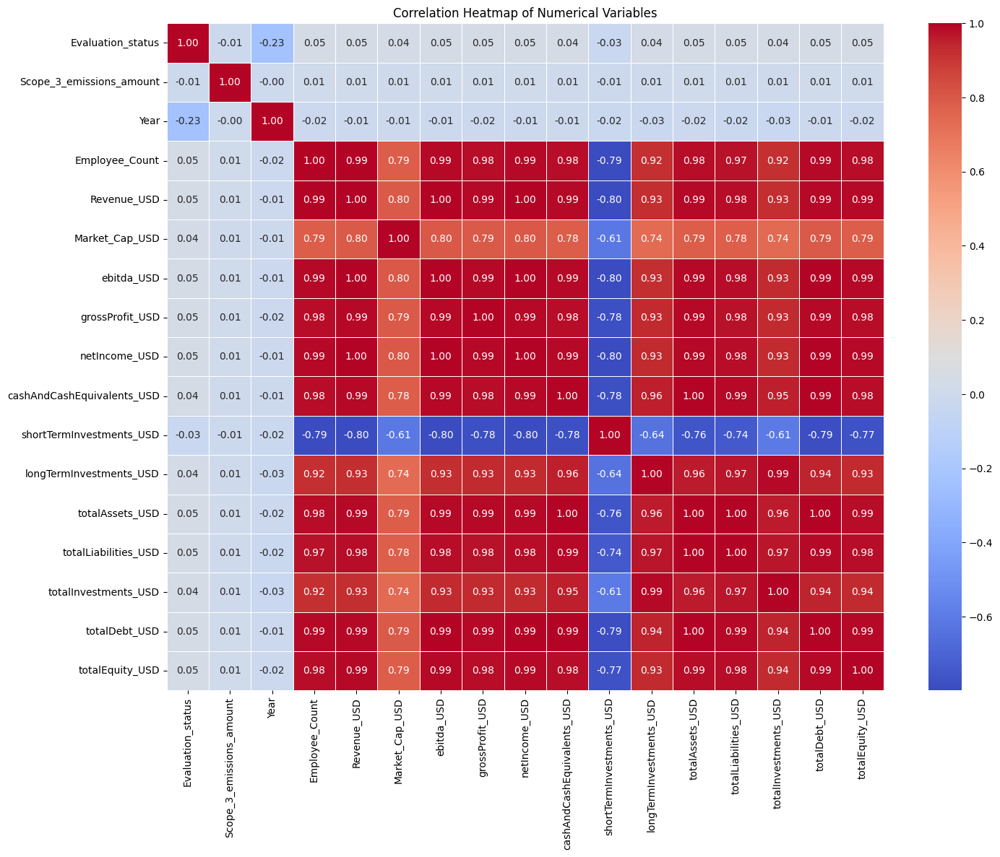

In [ ]:
# Calculate the correlation matrix
corr_matrix = df.select_dtypes(include=['number']).corr()

# Set the figure size
plt.figure(figsize=(16, 12))

# Create the heatmap using seaborn
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Set the title
plt.title('Correlation Heatmap of Numerical Variables')

# Display the plot
plt.show()

# END of PART 1 of the CODE!